In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import os

In [2]:
train = ImageDataGenerator(rescale = 1/255)
validation = ImageDataGenerator(rescale = 1/255)

In [3]:
train_dataset = train.flow_from_directory('training',
                                          target_size = (200,200),
                                          batch_size = 32,
                                          class_mode = 'binary')
validation_dataset = validation.flow_from_directory('validation',
                                          target_size = (200,200),
                                          batch_size = 2,
                                          class_mode = 'binary')

Found 435 images belonging to 2 classes.
Found 110 images belonging to 2 classes.


In [4]:
train_dataset.class_indices

{'watercabbage': 0, 'waterhyacinth': 1}

In [5]:
train_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [6]:
model = tf.keras.models.Sequential([tf.keras.layers.Conv2D(16,(3,3),activation = 'relu',input_shape = (200,200,3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    tf.keras.layers.Conv2D(32,(3,3),activation = 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    tf.keras.layers.Conv2D(64,(3,3),activation = 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    tf.keras.layers.Flatten(),
                                    tf.keras.layers.Dense(512,activation='relu'),
                                    tf.keras.layers.Dense(1,activation='sigmoid')
                                   ])

In [7]:
model.compile(loss= 'binary_crossentropy',
             optimizer = RMSprop(learning_rate=0.001),
             metrics = ['accuracy'])

In [8]:
model_fit = model.fit(train_dataset,
                     steps_per_epoch = 5,
                     epochs = 37,
                     validation_data= validation_dataset)

Epoch 1/37
5/5 [==============================] - 8s 1s/step - loss: 4.1001 - accuracy: 0.4694 - val_loss: 1.0907 - val_accuracy: 0.5000
Epoch 2/37
5/5 [==============================] - 6s 1s/step - loss: 0.8711 - accuracy: 0.4500 - val_loss: 0.6921 - val_accuracy: 0.5091
Epoch 3/37
5/5 [==============================] - 6s 1s/step - loss: 0.6950 - accuracy: 0.5875 - val_loss: 0.7572 - val_accuracy: 0.5000
Epoch 4/37
5/5 [==============================] - 6s 1s/step - loss: 0.6769 - accuracy: 0.5500 - val_loss: 0.6929 - val_accuracy: 0.5000
Epoch 5/37
5/5 [==============================] - 6s 1s/step - loss: 0.6645 - accuracy: 0.6187 - val_loss: 0.6507 - val_accuracy: 0.5818
Epoch 6/37
5/5 [==============================] - 7s 1s/step - loss: 0.8899 - accuracy: 0.6313 - val_loss: 0.6857 - val_accuracy: 0.5364
Epoch 7/37
5/5 [==============================] - 6s 1s/step - loss: 0.6879 - accuracy: 0.6562 - val_loss: 0.7069 - val_accuracy: 0.5000
Epoch 8/37
5/5 [=========================

In [9]:
validation_dataset.class_indices

{'watercabbage': 0, 'waterhyacinth': 1}

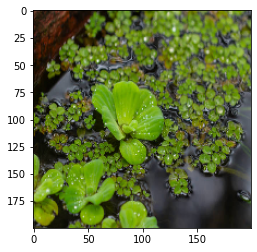

1/1 [==============================] - 0s 129ms/step
water hyacinth


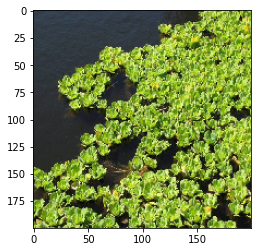

1/1 [==============================] - 0s 34ms/step
water hyacinth


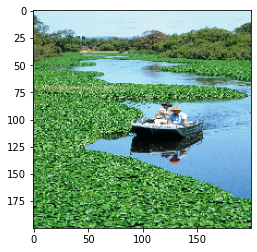

1/1 [==============================] - 0s 29ms/step
water hyacinth


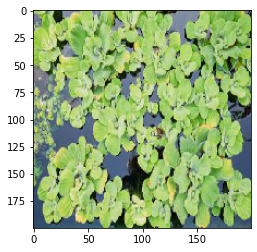

1/1 [==============================] - 0s 31ms/step
water hyacinth


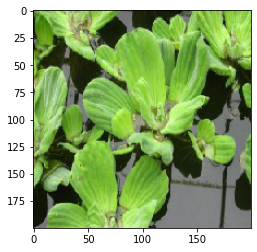

1/1 [==============================] - 0s 32ms/step
water hyacinth


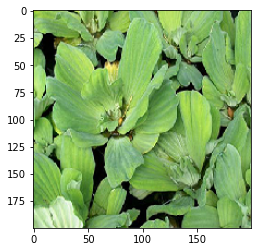

1/1 [==============================] - 0s 30ms/step
water hyacinth


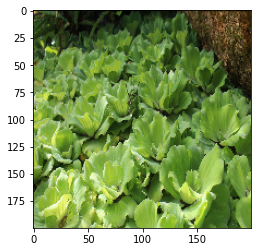

1/1 [==============================] - 0s 29ms/step
water cabbage


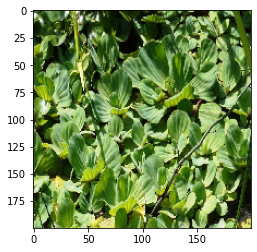

1/1 [==============================] - 0s 29ms/step
water hyacinth


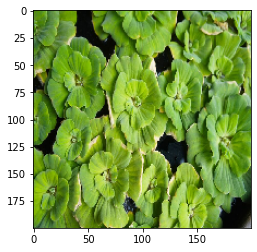

1/1 [==============================] - 0s 28ms/step
water hyacinth


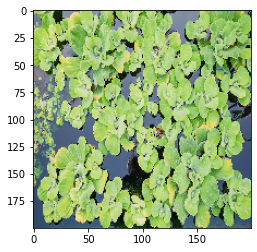

1/1 [==============================] - 0s 34ms/step
water hyacinth


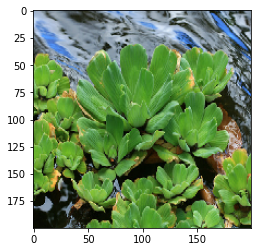

1/1 [==============================] - 0s 26ms/step
water hyacinth


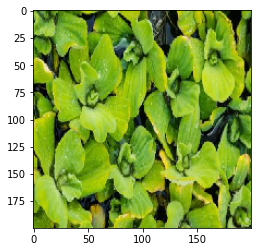

1/1 [==============================] - 0s 31ms/step
water hyacinth


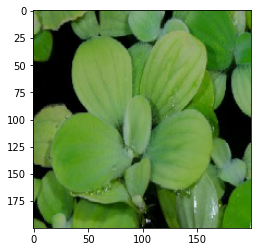

1/1 [==============================] - 0s 30ms/step
water hyacinth


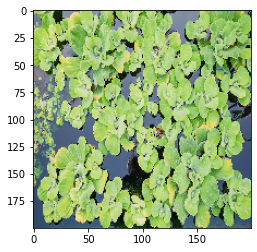

1/1 [==============================] - 0s 29ms/step
water hyacinth


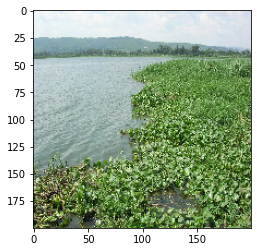

1/1 [==============================] - 0s 32ms/step
water hyacinth


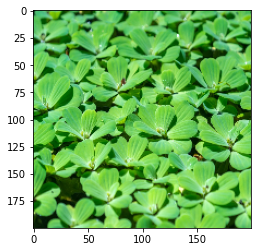

1/1 [==============================] - 0s 30ms/step
water hyacinth


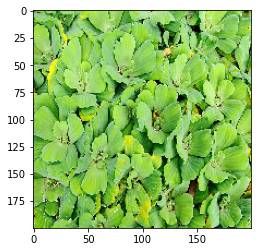

1/1 [==============================] - 0s 32ms/step
water hyacinth


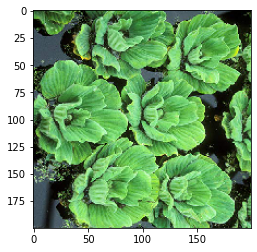

1/1 [==============================] - 0s 32ms/step
water hyacinth


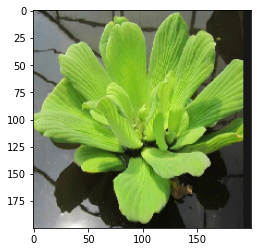

1/1 [==============================] - 0s 29ms/step
water cabbage


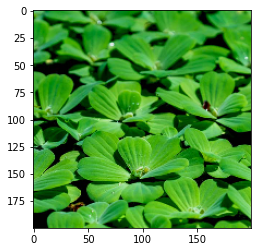

1/1 [==============================] - 0s 31ms/step
water hyacinth


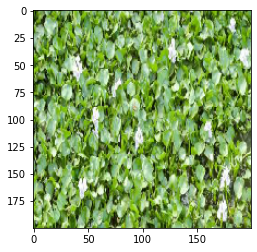

1/1 [==============================] - 0s 32ms/step
water hyacinth


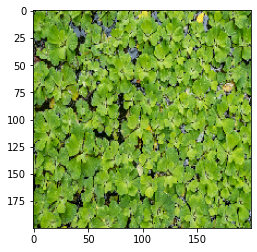

1/1 [==============================] - 0s 33ms/step
water hyacinth


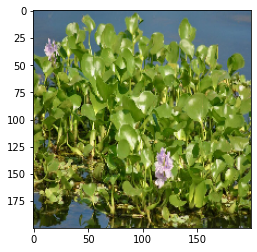

1/1 [==============================] - 0s 29ms/step
water hyacinth


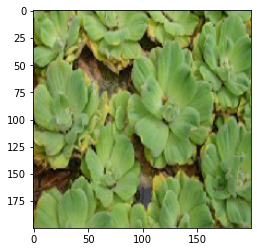

1/1 [==============================] - 0s 33ms/step
water hyacinth


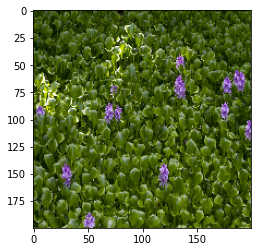

1/1 [==============================] - 0s 27ms/step
water hyacinth


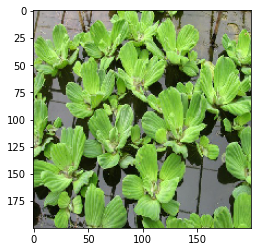

1/1 [==============================] - 0s 31ms/step
water hyacinth


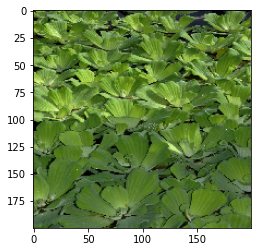

1/1 [==============================] - 0s 29ms/step
water hyacinth


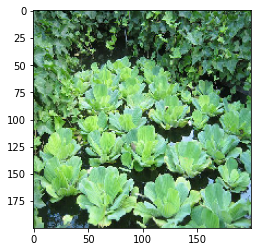

1/1 [==============================] - 0s 38ms/step
water hyacinth


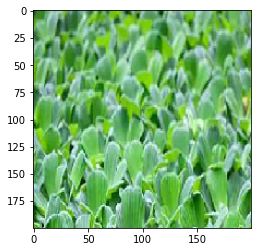

1/1 [==============================] - 0s 30ms/step
water hyacinth


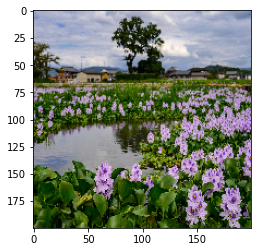

1/1 [==============================] - 0s 29ms/step
water hyacinth


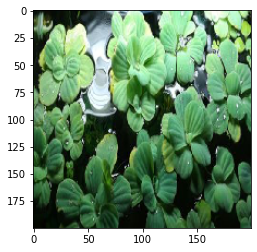

1/1 [==============================] - 0s 32ms/step
water hyacinth


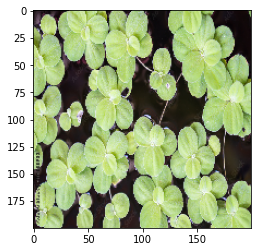

1/1 [==============================] - 0s 31ms/step
water cabbage


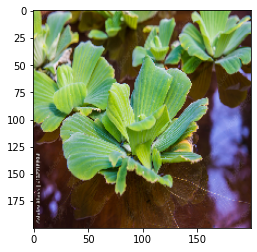

1/1 [==============================] - 0s 31ms/step
water hyacinth


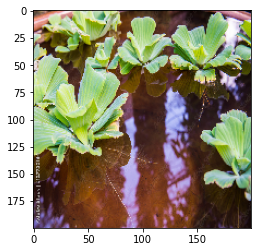

1/1 [==============================] - 0s 30ms/step
water hyacinth


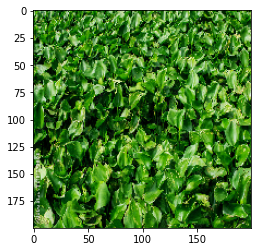

1/1 [==============================] - 0s 30ms/step
water hyacinth


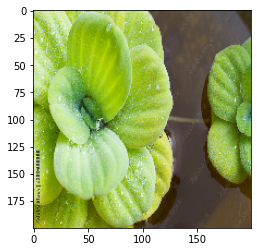

1/1 [==============================] - 0s 32ms/step
water hyacinth


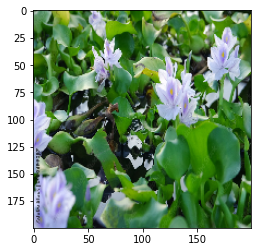

1/1 [==============================] - 0s 30ms/step
water hyacinth


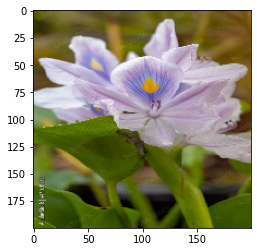

1/1 [==============================] - 0s 30ms/step
water hyacinth


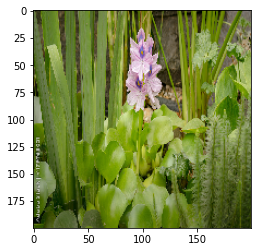

1/1 [==============================] - 0s 30ms/step
water hyacinth


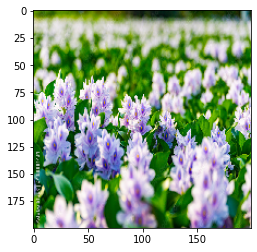

1/1 [==============================] - 0s 31ms/step
water hyacinth


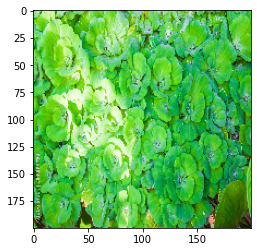

1/1 [==============================] - 0s 33ms/step
water hyacinth


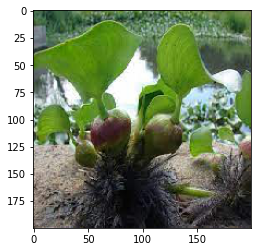

1/1 [==============================] - 0s 31ms/step
water hyacinth


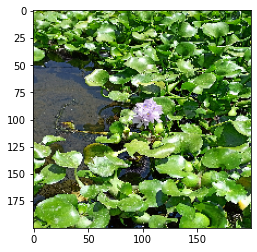

1/1 [==============================] - 0s 29ms/step
water hyacinth


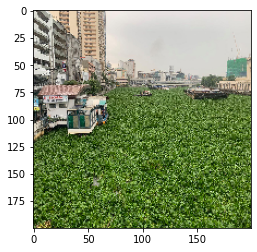

1/1 [==============================] - 0s 29ms/step
water hyacinth


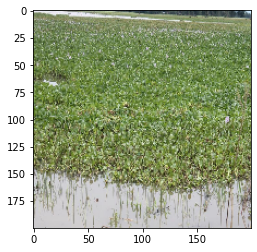

1/1 [==============================] - 0s 30ms/step
water hyacinth


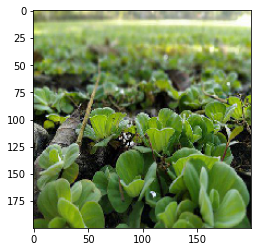

1/1 [==============================] - 0s 30ms/step
water hyacinth


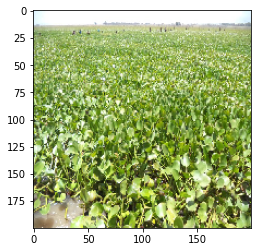

1/1 [==============================] - 0s 29ms/step
water hyacinth


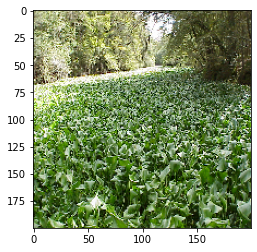

1/1 [==============================] - 0s 31ms/step
water hyacinth


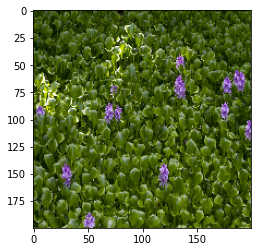

1/1 [==============================] - 0s 29ms/step
water hyacinth


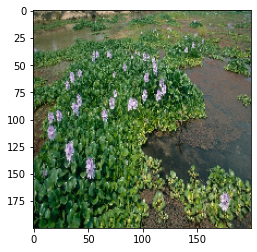

1/1 [==============================] - 0s 29ms/step
water hyacinth


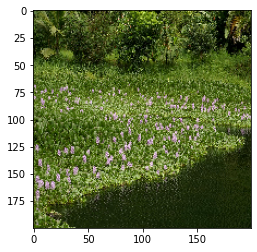

1/1 [==============================] - 0s 27ms/step
water hyacinth


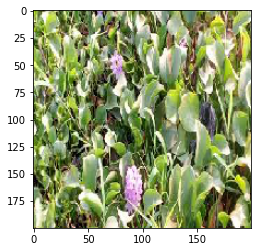

1/1 [==============================] - 0s 29ms/step
water hyacinth


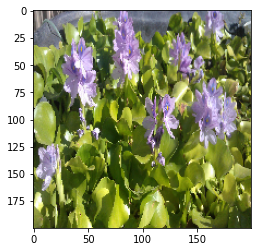

1/1 [==============================] - 0s 30ms/step
water hyacinth


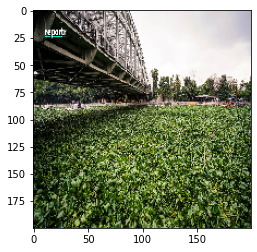

1/1 [==============================] - 0s 32ms/step
water hyacinth


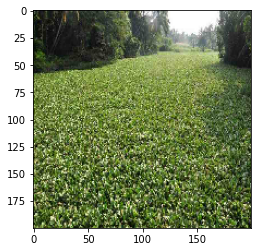

1/1 [==============================] - 0s 32ms/step
water hyacinth


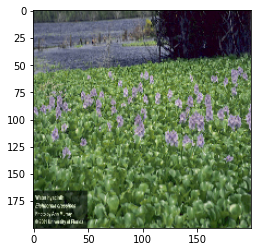

1/1 [==============================] - 0s 34ms/step
water hyacinth


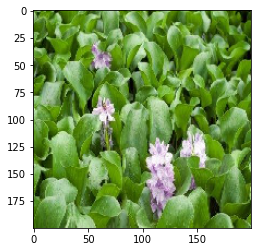

1/1 [==============================] - 0s 30ms/step
water hyacinth


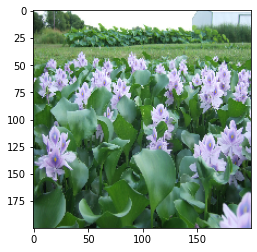

1/1 [==============================] - 0s 30ms/step
water hyacinth


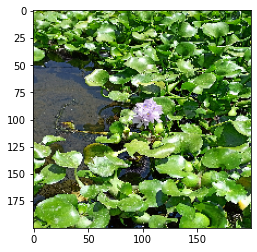

1/1 [==============================] - 0s 31ms/step
water hyacinth


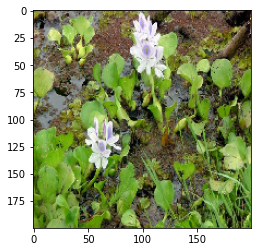

1/1 [==============================] - 0s 29ms/step
water hyacinth


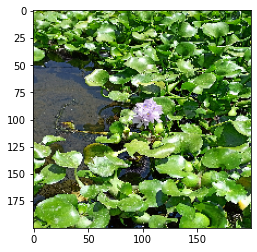

1/1 [==============================] - 0s 32ms/step
water hyacinth


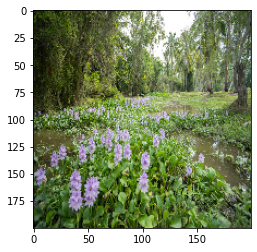

1/1 [==============================] - 0s 34ms/step
water hyacinth


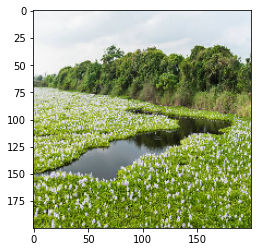

1/1 [==============================] - 0s 33ms/step
water hyacinth


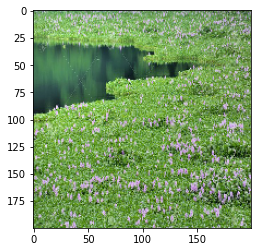

1/1 [==============================] - 0s 29ms/step
water hyacinth


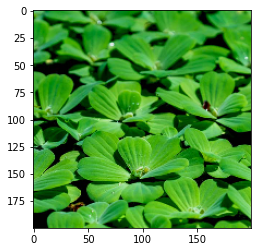

1/1 [==============================] - 0s 30ms/step
water hyacinth


PermissionError: [Errno 13] Permission denied: 'testing//water cabbage'

In [10]:
testing_path = "testing"

for i in os.listdir(testing_path):
    img = image.load_img(testing_path+"//"+i, target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    images = np.vstack([x])
    val = model.predict(images)
    if val == 0:
        print("water cabbage")
    else:
        print("water hyacinth")